<a href="https://colab.research.google.com/github/sarvangjain/communities-and-crime/blob/main/Communities%26Crime.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Analysing the dataset: Communities and Crime

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import pylab
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
from google.colab import drive
drive.mount("/content/gdrive")

Mounted at /content/gdrive


In [ ]:
pd.set_option('display.max_rows', 20)
text=pd.read_csv('/content/gdrive/My Drive/IDS Report/communitiesFINAL.csv')

In [ ]:
text=text.replace('?',float("NAN"))
text

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,...,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.0,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,0.36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,...,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.00,0.12,0.42,0.50,0.51,0.64,0.03,0.13,0.96,0.17,0.06,0.18,0.44,0.13,0.94,0.93,0.03,0.07,0.1,0.07,0.02,0.57,0.29,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.0,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,0.22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,...,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.00,0.21,0.50,0.34,0.60,0.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.0,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,0.28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,...,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.00,0.14,0.49,0.54,0.67,0.56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.0,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,0.36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,...,0.70,0.77,0.89,0.63,0.51,0.47,0.00,0.00,0.19,0.30,0.73,0.64,0.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.02,0.9,0.50,0.72,0.16,0.68,0.44,0.11,0.71,0.46,0.43,0.41,0.28,0.00,0.74,0.51,0.48,0.00,0.06,0.25,0.30,0.33,0.12,0.65,0.67,...,0.36,0.38,0.38,0.22,0.51,0.21,0.00,0.00,0.11,0.72,0.64,0.61,0.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,NaN,NaN,TempleTerracecity,10,0.01,0.40,0.10,0.87,0.12,0.16,0.43,0.51,0.35,0.30,0.03,1.0,0.42,0.74,0.14,0.64,0.30,0.06,0.46,0.41,0.49,0.50,0.27,0.00,0.16,0.36,0.52,0.01,0.16,0.08,0.11,0.65,0.12,0.71,0.17,...,0.39,0.41,0.41,0.50,0.48,0.39,0.00,0.00,0.22,0.28,0.34,0.48,0.39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01,0.28,0.05,NaN,NaN,NaN,NaN,0.00,NaN,0.09
1990,6,NaN,NaN,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,0.32,0.69,0.86,0.73,0.14,0.06,1.0,0.28,0.76,0.10,0.30,0.26,0.37,0.48,0.24,0.18,0.20,0.26,0.18,0.20,0.23,0.26,0.04,0.32,0.33,0.37,0.22,0.24,0.77,0.10,...,0.54,0.61,0.54,0.69,0.67,0.31,0.01,0.00,0.53,0.25,

In [ ]:
text.columns

Index(['state', 'county', 'community', 'communityname', 'fold', 'population',
       'householdsize', 'racepctblack', 'racePctWhite', 'racePctAsian',
       ...
       'LandArea', 'PopDens', 'PctUsePubTrans', 'PolicCars', 'PolicOperBudg',
       'LemasPctPolicOnPatr', 'LemasGangUnitDeploy', 'LemasPctOfficDrugUn',
       'PolicBudgPerPop', 'ViolentCrimesPerPop'],
      dtype='object', length=128)

In [ ]:
text.head()

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,...,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LemasSwornFT,LemasSwFTPerPop,LemasSwFTFieldOps,LemasSwFTFieldPerPop,LemasTotalReq,LemasTotReqPerPop,PolicReqPerOffic,PolicPerPop,RacialMatchCommPol,PctPolicWhite,PctPolicBlack,PctPolicHisp,PctPolicAsian,PctPolicMinor,OfficAssgnDrugUnits,NumKindsDrugsSeiz,PolicAveOTWorked,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,NaN,NaN,Lakewoodcity,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.0,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,0.36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,...,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.0,0.12,0.42,0.50,0.51,0.64,0.03,0.13,0.96,0.17,0.06,0.18,0.44,0.13,0.94,0.93,0.03,0.07,0.1,0.07,0.02,0.57,0.29,0.12,0.26,0.20,0.06,0.04,0.9,0.5,0.32,0.14,0.20
1,53,NaN,NaN,Tukwilacity,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.0,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,0.22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,...,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.0,0.21,0.50,0.34,0.60,0.52,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.12,0.45,NaN,NaN,NaN,NaN,0.00,NaN,0.67
2,24,NaN,NaN,Aberdeentown,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.0,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,0.28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,...,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.0,0.14,0.49,0.54,0.67,0.56,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.01,0.21,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.0,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,0.36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,...,0.70,0.77,0.89,0.63,0.51,0.47,0.00,0.0,0.19,0.30,0.73,0.64,0.65,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.02,0.39,0.28,NaN,NaN,NaN,NaN,0.00,NaN,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.02,0.9,0.50,0.72,0.16,0.68,0.44,0.11,0.71,0.46,0.43,0.41,0.28,0.00,0.74,0.51,0.48,0.00,0.06,0.25,0.30,0.33,0.12,0.65,0.67,...,0.36,0.38,0.38,0.22,0.51,0.21,0.00,0.0,0.11,0.72,0.64,0.61,0.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.04,0.09,0.02,NaN,NaN,NaN,NaN,0.00,NaN,0.03


In [ ]:
text.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1994 entries, 0 to 1993
Columns: 128 entries, state to ViolentCrimesPerPop
dtypes: float64(100), int64(2), object(26)
memory usage: 1.9+ MB


In [ ]:
text.shape

(1994, 128)

In [ ]:
stat=pd.read_csv('/content/gdrive/My Drive/IDS Report/Summary_Stat.txt',header=None)
stat

,0,1,2,3,4,5,6,7,8
0,Attribute,Min,Max,Mean,SD,Correl,Median,Mode,Missing
1,population,0,1,0.06,0.13,0.37,0.02,0.01,0
2,householdsize,0,1,0.46,0.16,-0.03,0.44,0.41,0
3,racepctblack,0,1,0.18,0.25,0.63,0.06,0.01,0
4,racePctWhite,0,1,0.75,0.24,-0.68,0.85,0.98,0
...,...,...,...,...,...,...,...,...,...
119,LemasPctPolicOnPatr,0,1,0.70,0.21,-0.08,0.75,0.74,1675
120,LemasGangUnitDeploy,0,1,0.44,0.41,0.12,0.5,0,1675
121,LemasPctOfficDrugUn,0,1,0.09,0.24,0.35,0,0,0
122,PolicBudgPerPop,0,1,0.20,0.16,0.10,0.15,0.12,1675


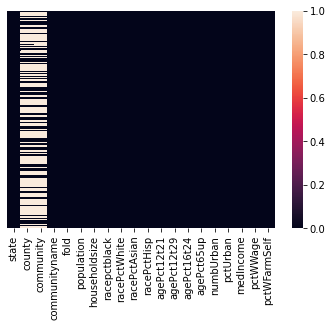

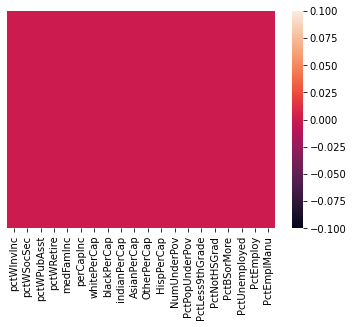

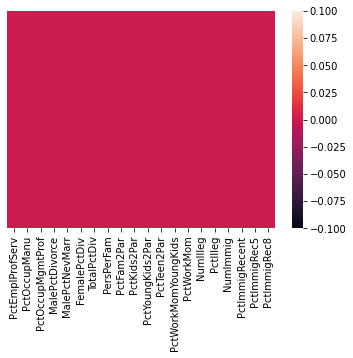

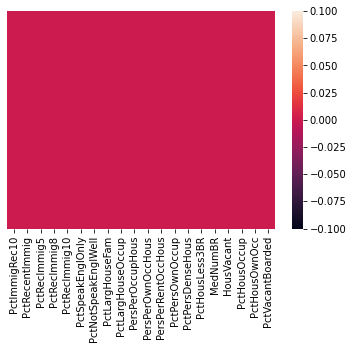

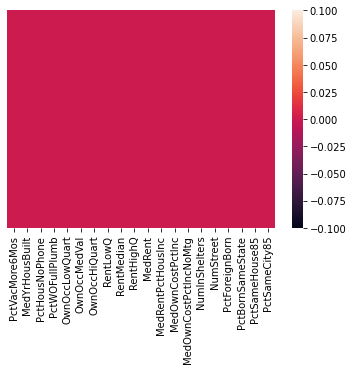

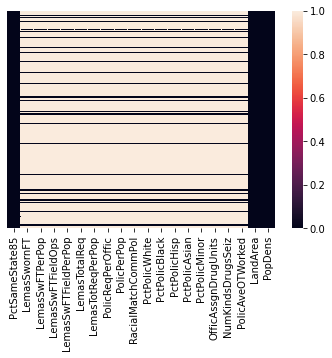

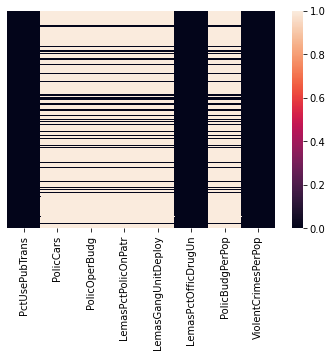

In [ ]:
df1 = text.iloc[:,0:20]
df2 = text.iloc[:,20:40]
df3 = text.iloc[:,40:60]
df4 = text.iloc[:,60:80]
df5 = text.iloc[:,80:100]
df6 = text.iloc[:,100:120]
df7 = text.iloc[:,120:]
sns.heatmap(df1.sample(250).isnull(),yticklabels=False)
plt.show()
sns.heatmap(df2.sample(250).isnull(),yticklabels=False)
plt.show()
sns.heatmap(df3.sample(250).isnull(),yticklabels=False)
plt.show()
sns.heatmap(df4.sample(250).isnull(),yticklabels=False)
plt.show()
sns.heatmap(df5.sample(250).isnull(),yticklabels=False)
plt.show()
sns.heatmap(df6.sample(250).isnull(),yticklabels=False)
plt.show()
sns.heatmap(df7.sample(250).isnull(),yticklabels=False)
plt.show()

In [ ]:
pd.set_option('display.max_rows',None)
text.isnull().sum()

state                       0
county                   1174
community                1177
communityname               0
fold                        0
population                  0
householdsize               0
racepctblack                0
racePctWhite                0
racePctAsian                0
racePctHisp                 0
agePct12t21                 0
agePct12t29                 0
agePct16t24                 0
agePct65up                  0
numbUrban                   0
pctUrban                    0
medIncome                   0
pctWWage                    0
pctWFarmSelf                0
pctWInvInc                  0
pctWSocSec                  0
pctWPubAsst                 0
pctWRetire                  0
medFamInc                   0
perCapInc                   0
whitePerCap                 0
blackPerCap                 0
indianPerCap                0
AsianPerCap                 0
OtherPerCap                 1
HispPerCap                  0
NumUnderPov                 0
PctPopUnde

In [ ]:
del text['LemasTotReqPerPop']
del text['county']
del text['community']
del text['LemasSwornFT']
del text['LemasSwFTPerPop']
del text['PolicReqPerOffic']
del text['OfficAssgnDrugUnits']
del text['PolicAveOTWorked']
del text['PolicOperBudg']
del text['PctPolicMinor']
del text['NumKindsDrugsSeiz']
del text['LemasPctPolicOnPatr']
del text['LemasGangUnitDeploy']
del text['LemasPctOfficDrugUn']
del text['PolicBudgPerPop']
del text['PolicCars']
del text['PolicPerPop']
del text['PctPolicBlack']
del text['RacialMatchCommPol']
del text['PctPolicHisp']
del text['PctPolicWhite']
del text['LemasSwFTFieldOps']
del text['LemasSwFTFieldPerPop']
del text['LemasTotalReq']
del text['PctPolicAsian']

In [ ]:

text.isnull().sum()

state                    0
communityname            0
fold                     0
population               0
householdsize            0
racepctblack             0
racePctWhite             0
racePctAsian             0
racePctHisp              0
agePct12t21              0
agePct12t29              0
agePct16t24              0
agePct65up               0
numbUrban                0
pctUrban                 0
medIncome                0
pctWWage                 0
pctWFarmSelf             0
pctWInvInc               0
pctWSocSec               0
pctWPubAsst              0
pctWRetire               0
medFamInc                0
perCapInc                0
whitePerCap              0
blackPerCap              0
indianPerCap             0
AsianPerCap              0
OtherPerCap              1
HispPerCap               0
NumUnderPov              0
PctPopUnderPov           0
PctLess9thGrade          0
PctNotHSGrad             0
PctBSorMore              0
PctUnemployed            0
PctEmploy                0
P

In [ ]:
text.shape

(1994, 103)

In [ ]:
pd.set_option('display.max_rows',None)
text.mean()

state                    28.683551
fold                      5.493982
population                0.057593
householdsize             0.463395
racepctblack              0.179629
racePctWhite              0.753716
racePctAsian              0.153681
racePctHisp               0.144022
agePct12t21               0.424218
agePct12t29               0.493867
agePct16t24               0.336264
agePct65up                0.423164
numbUrban                 0.064072
pctUrban                  0.696269
medIncome                 0.361123
pctWWage                  0.558154
pctWFarmSelf              0.291570
pctWInvInc                0.495687
pctWSocSec                0.471133
pctWPubAsst               0.317778
pctWRetire                0.479248
medFamInc                 0.375677
perCapInc                 0.350251
whitePerCap               0.368049
blackPerCap               0.291098
indianPerCap              0.203506
AsianPerCap               0.322357
HispPerCap                0.386279
NumUnderPov         

In [ ]:
#isko nhi krna hai!!!!!
#x=text['OtherPerCap'].mean()
#y=text['OtherPerCap'].mode()
#z=text['OtherPerCap'].median()
text["OtherPerCap"].median()

0.25

In [ ]:
display(text.describe())

,state,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctDivorce,...,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,ViolentCrimesPerPop
count,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,...,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000,1994.000000
mean,28.683551,5.493982,0.057593,0.463395,0.179629,0.753716,0.153681,0.144022,0.424218,0.493867,0.336264,0.423164,0.064072,0.696269,0.361123,0.558154,0.291570,0.495687,0.471133,0.317778,0.479248,0.375677,0.350251,0.368049,0.291098,0.203506,0.322357,0.386279,0.055507,0.303024,0.315807,0.383330,0.361675,0.363531,0.501073,0.396384,0.440597,0.391224,0.441339,0.461244,...,0.785903,0.150587,0.267608,0.251891,0.462101,0.494428,0.404097,0.562598,0.186264,0.495186,0.314694,0.076815,0.719549,0.548686,0.204529,0.433335,0.494178,0.264478,0.243059,0.264689,0.263490,0.268942,0.346379,0.372457,0.422964,0.384102,0.490125,0.449754,0.403816,0.029438,0.022778,0.215552,0.608892,0.535050,0.626424,0.651530,0.065231,0.232854,0.161685,0.237979
std,16.397553,2.873694,0.126906,0.163717,0.253442,0.244039,0.208877,0.232492,0.155196,0.143564,0.166505,0.179185,0.128256,0.444811,0.209362,0.182913,0.204108,0.178071,0.173619,0.222137,0.167564,0.198257,0.191109,0.186804,0.171593,0.164775,0.195411,0.183081,0.127941,0.228474,0.213360,0.202508,0.209193,0.202171,0.174036,0.202386,0.175457,0.198922,0.186292,0.182460,...,0.226869,0.219716,0.196567,0.190709,0.169551,0.157924,0.189301,0.197087,0.209956,0.172508,0.255182,0.150465,0.194024,0.185204,0.217770,0.188986,0.232467,0.242847,0.206295,0.224425,0.231542,0.235252,0.219323,0.209278,0.248286,0.213404,0.169500,0.187274,0.192593,0.102607,0.100400,0.231134,0.204329,0.181352,0.200521,0.198221,0.109459,0.203092,0.229055,0.232985
min,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.

In [ ]:
categorical=list(text.select_dtypes(include=['object']).columns.values)
categorical

['communityname', 'OtherPerCap']

In [ ]:
text["OtherPerCap"] = text["OtherPerCap"].replace(np.nan, 'none', regex=True)

le=LabelEncoder()
for i in range(0,len(categorical)):
  text[categorical[i]]=le.fit_transform(text[categorical[i]])
  x=1
text.head()

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,...,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,ViolentCrimesPerPop
0,8,804,1,0.19,0.33,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,0.20,1.0,0.37,0.72,0.34,0.60,0.29,0.15,0.43,0.39,0.40,0.39,0.32,0.27,0.27,36,0.41,0.08,0.19,0.10,0.18,0.48,0.27,0.68,0.23,0.41,0.25,...,0.89,0.06,0.14,0.13,0.33,0.39,0.28,0.55,0.09,0.51,0.5,0.21,0.71,0.52,0.05,0.26,0.65,0.14,0.06,0.22,0.19,0.18,0.36,0.35,0.38,0.34,0.38,0.46,0.25,0.04,0.0,0.12,0.42,0.50,0.51,0.64,0.12,0.26,0.20,0.20
1,53,1625,1,0.00,0.16,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,0.02,1.0,0.31,0.72,0.11,0.45,0.25,0.29,0.39,0.29,0.37,0.38,0.33,0.16,0.30,22,0.35,0.01,0.24,0.14,0.24,0.30,0.27,0.73,0.57,0.15,0.42,...,0.84,0.10,0.16,0.10,0.17,0.29,0.17,0.26,0.20,0.82,0.0,0.02,0.79,0.24,0.02,0.25,0.65,0.16,0.00,0.21,0.20,0.21,0.42,0.38,0.40,0.37,0.29,0.32,0.18,0.00,0.0,0.21,0.50,0.34,0.60,0.52,0.02,0.12,0.45,0.67
2,24,1,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.0,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,0.29,0.49,...,0.88,0.04,0.20,0.20,0.46,0.52,0.43,0.42,0.15,0.51,0.5,0.01,0.86,0.41,0.29,0.30,0.52,0.47,0.45,0.18,0.17,0.16,0.27,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.0,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.43
3,34,1787,1,0.04,0.77,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,0.06,1.0,0.58,0.89,0.21,0.43,0.36,0.20,0.82,0.51,0.36,0.40,0.39,0.16,0.25,36,0.44,0.01,0.10,0.09,0.25,0.31,0.33,0.71,0.36,0.45,0.37,...,0.81,0.08,0.56,0.62,0.85,0.77,1.00,0.94,0.12,0.01,0.5,0.01,0.97,0.96,0.60,0.47,0.52,0.11,0.11,0.24,0.21,0.19,0.75,0.70,0.77,0.89,0.63,0.51,0.47,0.00,0.0,0.19,0.30,0.73,0.64,0.65,0.02,0.39,0.28,0.12
4,42,141,1,0.01,0.55,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.02,0.9,0.50,0.72,0.16,0.68,0.44,0.11,0.71,0.46,0.43,0.41,0.28,0.00,0.74,51,0.48,0.00,0.06,0.25,0.30,0.33,0.12,0.65,0.67,0.38,0.42,...,0.88,0.05,0.16,0.19,0.59,0.60,0.37,0.89,0.02,0.19,0.5,0.01,0.89,0.87,0.04,0.55,0.73,0.05,0.14,0.31,0.31,0.30,0.40,0.36,0.38,0.38,0.22,0.51,0.21,0.00,0.0,0.11,0.72,0.64,0.61,0.53,0.04,0.09,0.02,0.03


In [ ]:
pd.reset_option('display.max_rows', None)
com=text['communityname']
text.sort_values("communityname", inplace = True)
text.drop_duplicates(subset ="communityname", keep = False, inplace = True)
text

,state,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,numbUrban,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,NumUnderPov,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,...,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseFam,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,ViolentCrimesPerPop
2,24,1,1,0.00,0.42,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.00,0.00,0.30,0.58,0.19,0.39,0.38,0.40,0.84,0.28,0.27,0.29,0.27,0.07,0.29,28,0.39,0.01,0.27,0.27,0.43,0.19,0.36,0.58,0.32,0.29,0.49,...,0.88,0.04,0.20,0.20,0.46,0.52,0.43,0.42,0.15,0.51,0.5,0.01,0.86,0.41,0.29,0.30,0.52,0.47,0.45,0.18,0.17,0.16,0.27,0.29,0.27,0.31,0.48,0.39,0.28,0.00,0.00,0.14,0.49,0.54,0.67,0.56,0.01,0.21,0.02,0.43
1401,34,2,8,0.01,0.56,0.22,0.75,0.21,0.09,0.36,0.48,0.28,0.24,0.03,1.00,0.64,0.84,0.19,0.57,0.33,0.12,0.43,0.59,0.49,0.51,0.35,0.50,0.41,32,0.71,0.00,0.07,0.20,0.28,0.45,0.30,0.67,0.32,0.40,0.31,...,0.80,0.07,0.27,0.27,0.60,0.64,0.38,0.83,0.09,0.35,0.5,0.01,0.85,0.79,0.49,0.57,0.54,0.05,0.09,0.40,0.39,0.36,0.65,0.62,0.74,0.65,0.52,0.66,0.89,0.01,0.00,0.24,0.48,0.71,0.59,0.63,0.01,0.26,0.72,0.12
1671,40,3,9,0.01,0.29,0.08,0.72,0.03,0.02,0.61,0.58,0.55,0.67,0.00,0.00,0.07,0.18,0.47,0.35,0.69,0.48,0.47,0.14,0.18,0.20,0.20,0.13,0.08,12,0.19,0.03,0.61,0.44,0.51,0.37,0.55,0.28,0.29,0.67,0.40,...,0.93,0.02,0.14,0.11,0.24,0.24,0.29,0.45,0.10,0.62,0.0,0.05,0.48,0.46,0.30,0.51,0.46,0.63,0.32,0.04,0.04,0.06,0.06,0.10,0.10,0.11,0.52,0.34,0.53,0.01,0.00,0.03,0.75,0.48,0.59,0.82,0.03,0.10,0.01,0.22
1209,6,4,7,0.02,0.66,0.02,0.85,0.42,0.11,0.49,0.42,0.25,0.08,0.03,1.00,0.98,0.85,0.25,0.64,0.12,0.05,0.12,0.92,0.77,0.76,0.49,0.52,0.56,50,0.62,0.01,0.08,0.05,0.09,0.72,0.18,0.78,0.24,0.41,0.10,...,0.73,0.11,0.23,0.26,0.73,0.74,0.55,0.85,0.10,0.18,0.5,0.02,0.84,0.83,0.05,0.17,0.83,0.00,0.06,0.95,1.00,1.00,1.00,0.99,1.00,0.95,0.57,0.94,0.21,0.00,0.00,0.42,0.45,0.37,0.63,0.62,0.02,0.21,0.03,0.15
1541,45,5,8,0.02,0.39,0.60,0.51,0.04,0.01,0.34,0.38,0.23,0.54,0.03,1.00,0.36,0.48,0.21,0.54,0.57,0.40,0.65,0.39,0.36,0.47,0.19,0.21,0.31,17,0.39,0.03,0.41,0.33,0.35,0.53,0.28,0.39,0.58,0.42,0.34,...,0.96,0.03,0.23,0.21,0.39,0.39,0.41,0.59,0.13,0.39,0.5,0.04,0.62,0.60,0.23,0.47,0.60,0.38,0.01,0.13,0.17,0.21,0.14,0.24,0.33,0.28,0.48,0.38,0.36,0.02,0.00,0.04,0.44,0.47,0.50,0.33,0.04,0.12,0.00,0.21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
675,39,1823,4,0.14,0.40,0.74,0.38,0.02,0.07,0.42,0.43,0.29,0.62,0.15,1.00,0.09,0.11,0.07,0.24,0.72,1.00,0.79,0.12,0.11,0.16,0.16,0.16,0.09,17,0.20,0.25,0.77,0.36,0.60,0.11,1.00,0.05,0.42,0.54,0.64,...,0.84,0.09,0.34,0.29,0.41,0.41,0.43,0.57,0.08,0.44,0.5,0.20,0.62,0.58,0.80,0.67,0.08,0.44,0.41,0.02,0.01,0.01,0.06,0.10,0.11,0.13,0.92,0.30,0.61,0.07,0.00,0.08,0.76,0.76,0.90,0.86,0.10,0.24,0.14,0.95
670,6,1824,4,0.03,0.41,0.05,0.64,0.47,0.33,0.40,0.54,0.34,0.36,0.04,1.00,0.20,0.52,0.57,0.30,0.41,0.70,0.52,0.21,0.23,0.26,0.23,0.22,0.18,18,0.21,0.04,0.49,0.38,0.44,0.25,0.75,0.37,0.20,0.43,0.29,...,0.64,0.40,0.36,0.30,0.42,0

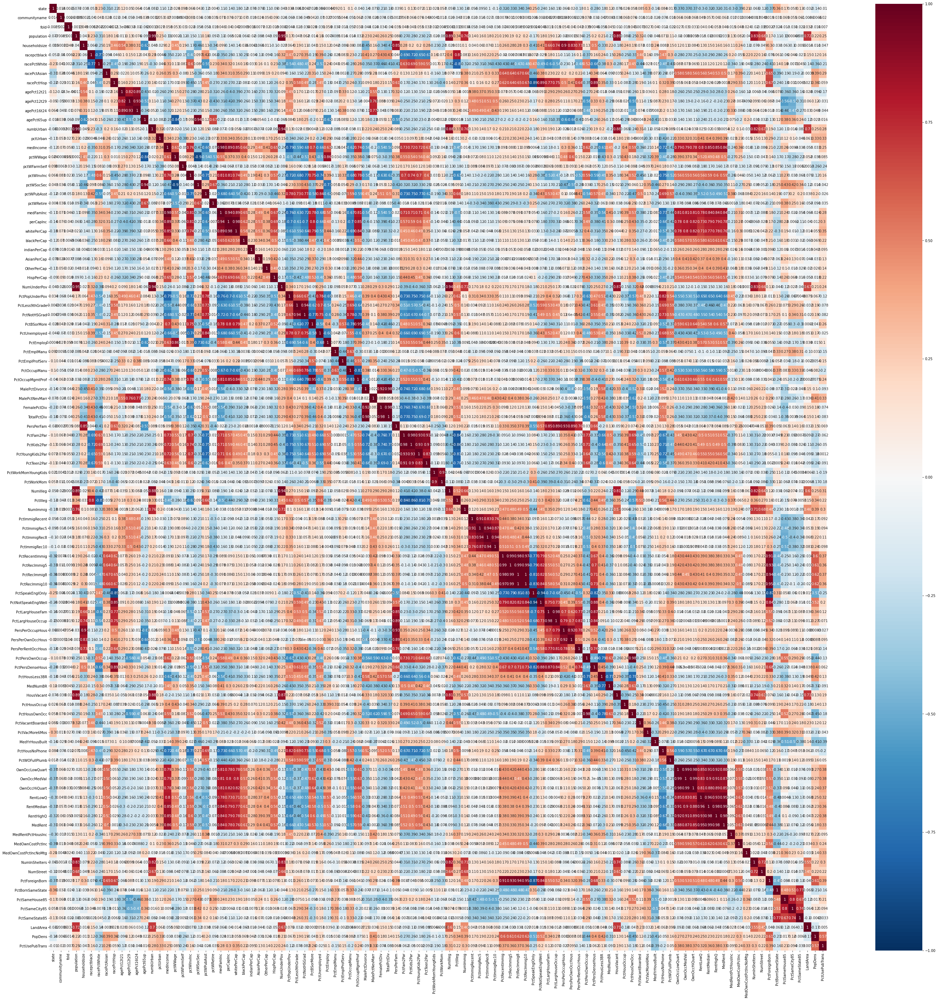

In [ ]:
c=text.iloc[:,:]
features = list(c)
features.remove("ViolentCrimesPerPop")
X=text[features]
correlation = X.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

In [ ]:
del text['householdsize']
del text['fold']
del text['numbUrban']
del text['NumUnderPov']
del text['MalePctDivorce']
del text['FemalePctDiv']
del text['PctFam2Par']
del text['PctKids2Par']
del text['PctYoungKids2Par']
del text['PctTeen2Par']
del text['PctWorkMomYoungKids']
del text['PctWorkMom']
del text['NumIlleg']
del text['NumImmig']
del text['PctImmigRecent']
del text['PctImmigRec5']
del text['PctImmigRec8']
del text['PctImmigRec10']
del text['PctRecImmig5']
del text['PctRecImmig8']
del text['PctRecImmig10']
del text['PctLargHouseFam']

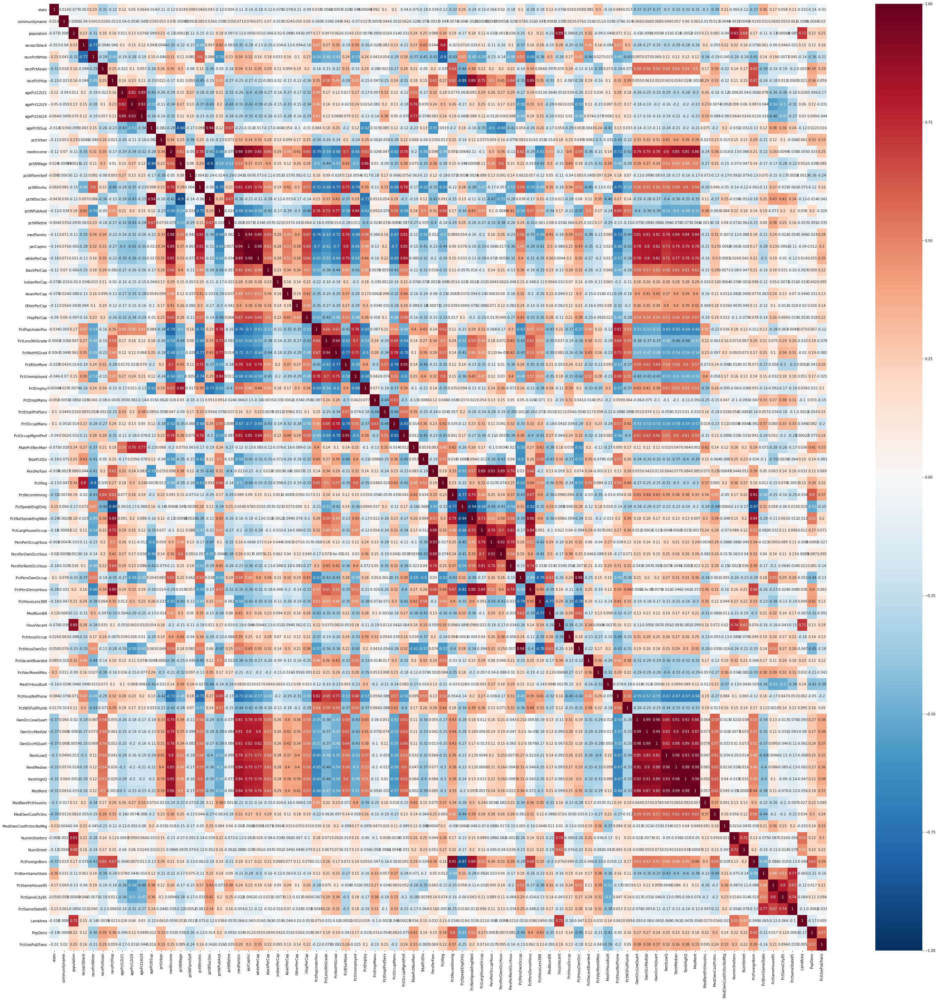

In [ ]:
c=text.iloc[:,:]
features = list(c)
features.remove("ViolentCrimesPerPop")
X=text[features]
correlation = X.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

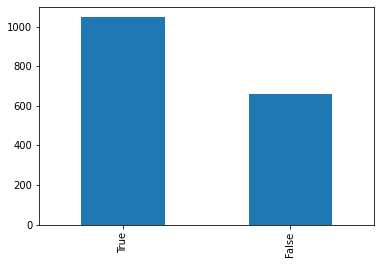

In [ ]:
text['HighCrime']=(text['ViolentCrimesPerPop']>0.1)
text.HighCrime.value_counts().plot(kind="bar")

In [ ]:
x=text.HighCrime.value_counts()
x

True     1046
False     661
Name: HighCrime, dtype: int64

Text(0.5, 0.98, 'Analyzing distribution for the series')

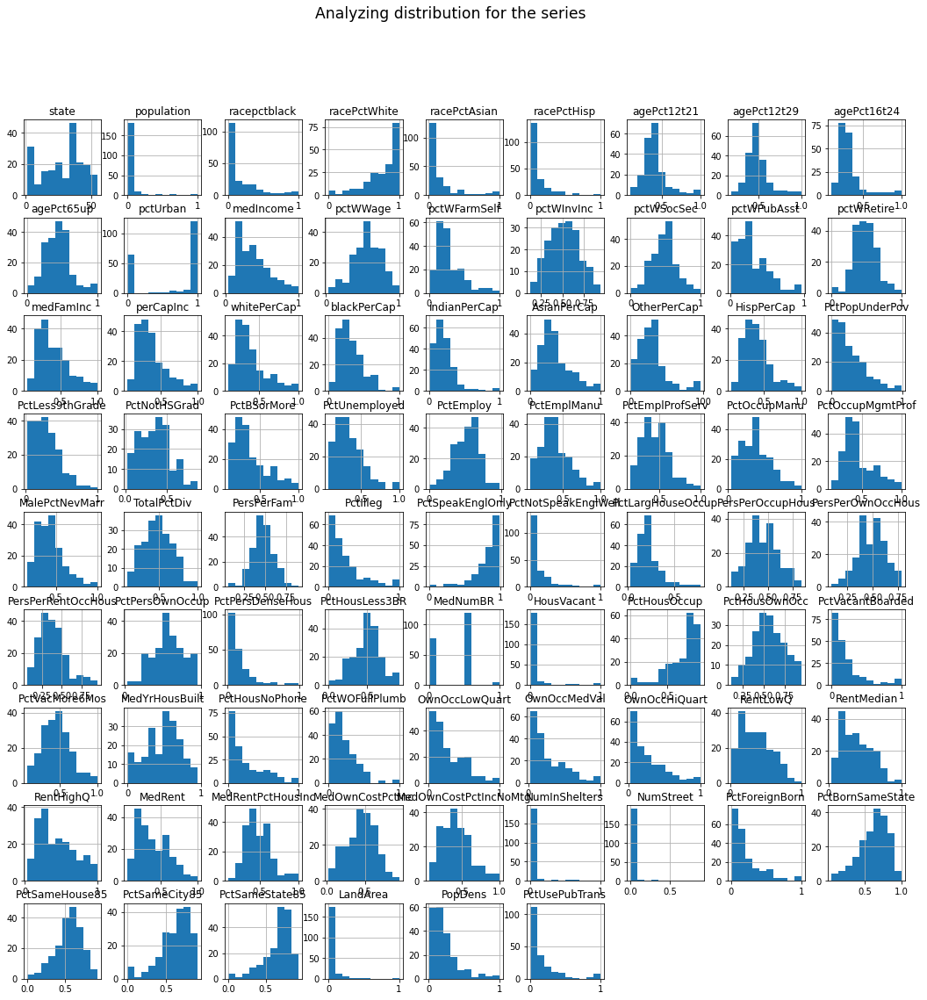

In [ ]:
text.sample(200).hist(column=['state' , 'population' , 'racepctblack' , 'racePctWhite' , 'racePctAsian' ,
'racePctHisp' , 'agePct12t21' , 'agePct12t29' , 'agePct16t24' , 'agePct65up' , 'pctUrban' , 'medIncome' ,
 'pctWWage' , 'pctWFarmSelf' , 'pctWInvInc' , 'pctWSocSec' , 'pctWPubAsst' , 'pctWRetire' ,
'medFamInc' , 'perCapInc' , 'whitePerCap' , 'blackPerCap' , 'indianPerCap' , 'AsianPerCap' , 'OtherPerCap' ,
 'HispPerCap' , 'PctPopUnderPov' , 'PctLess9thGrade' , 'PctNotHSGrad' , 'PctBSorMore' , 'PctUnemployed' ,
  'PctEmploy' , 'PctEmplManu' , 'PctEmplProfServ' , 'PctOccupManu' ,
'PctOccupMgmtProf' , 'MalePctNevMarr' , 'TotalPctDiv' , 'PersPerFam' , 'PctIlleg' , 'PctSpeakEnglOnly' ,
 'PctNotSpeakEnglWell' , 'PctLargHouseOccup' , 'PersPerOccupHous' , 'PersPerOwnOccHous' , 'PersPerRentOccHous' ,
  'PctPersOwnOccup' , 'PctPersDenseHous' , 'PctHousLess3BR' , 'MedNumBR' , 'HousVacant' , 'PctHousOccup' ,
   'PctHousOwnOcc' , 'PctVacantBoarded' , 'PctVacMore6Mos' , 'MedYrHousBuilt' , 'PctHousNoPhone' ,
    'PctWOFullPlumb' , 'OwnOccLowQuart' , 'OwnOccMedVal' , 'OwnOccHiQuart' , 'RentLowQ' , 'RentMedian' ,
     'RentHighQ' , 'MedRent' , 'MedRentPctHousInc' , 'MedOwnCostPctInc' , 'MedOwnCostPctIncNoMtg' ,
      'NumInShelters' , 'NumStreet' , 'PctForeignBorn' , 'PctBornSameState' , 'PctSameHouse85' ,
       'PctSameCity85' , 'PctSameState85' , 'LandArea' , 'PopDens' , 'PctUsePubTrans' ],figsize=(18,18))
pylab.suptitle("Analyzing distribution for the series", fontsize="xx-large")

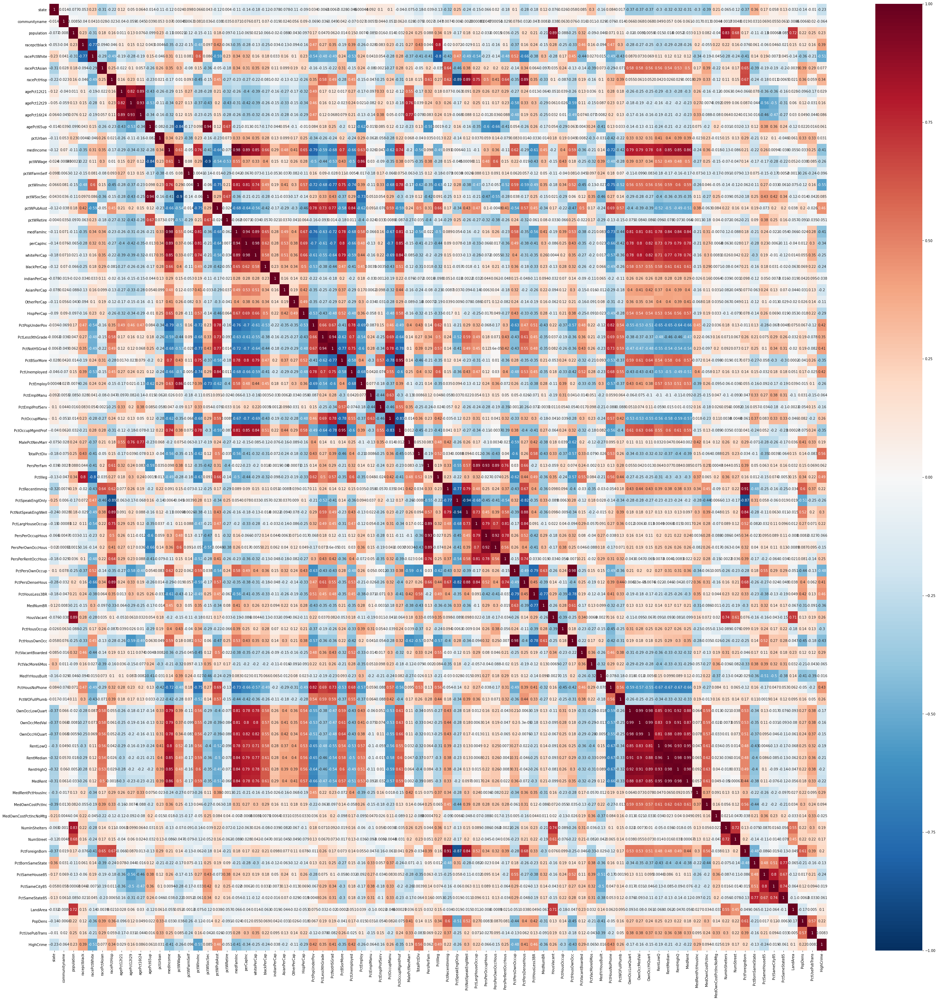

In [ ]:
c=text.iloc[:,:]
features = list(c)
features.remove("ViolentCrimesPerPop")
X=text[features]
correlation = X.corr()
plt.figure(figsize=(50, 50))
sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

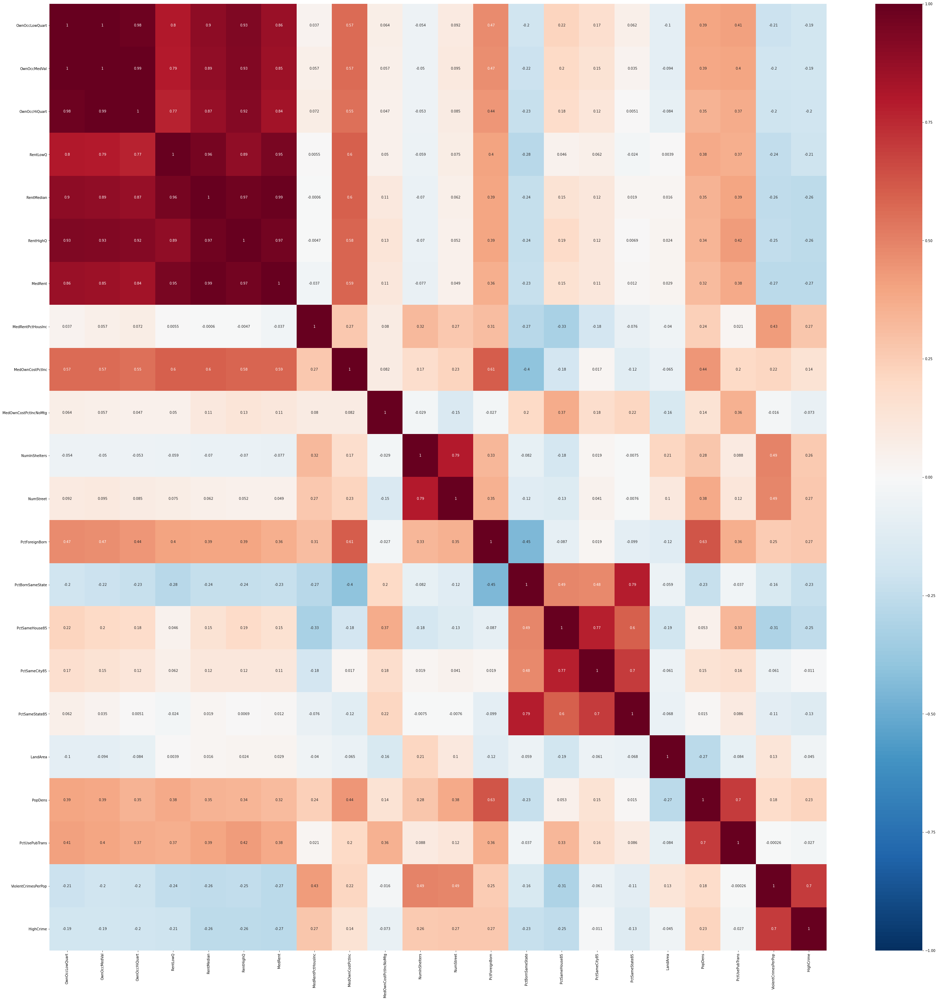

In [ ]:
c=text.iloc[:,60:]
correlation = c.sample(100).corr()
plt.figure(figsize=(50, 50))
sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

In [ ]:
x=text['communityname']
x

2          1
1401       2
1671       3
1209       4
1541       5
        ... 
675     1823
670     1824
89      1825
1657    1826
307     1827
Name: communityname, Length: 1707, dtype: int64

In [ ]:
y=text.sort_values('ViolentCrimesPerPop')
y

,state,communityname,population,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,pctUrban,medIncome,pctWWage,pctWFarmSelf,pctWInvInc,pctWSocSec,pctWPubAsst,pctWRetire,medFamInc,perCapInc,whitePerCap,blackPerCap,indianPerCap,AsianPerCap,OtherPerCap,HispPerCap,PctPopUnderPov,PctLess9thGrade,PctNotHSGrad,PctBSorMore,PctUnemployed,PctEmploy,PctEmplManu,PctEmplProfServ,PctOccupManu,PctOccupMgmtProf,MalePctNevMarr,TotalPctDiv,PersPerFam,...,PctSpeakEnglOnly,PctNotSpeakEnglWell,PctLargHouseOccup,PersPerOccupHous,PersPerOwnOccHous,PersPerRentOccHous,PctPersOwnOccup,PctPersDenseHous,PctHousLess3BR,MedNumBR,HousVacant,PctHousOccup,PctHousOwnOcc,PctVacantBoarded,PctVacMore6Mos,MedYrHousBuilt,PctHousNoPhone,PctWOFullPlumb,OwnOccLowQuart,OwnOccMedVal,OwnOccHiQuart,RentLowQ,RentMedian,RentHighQ,MedRent,MedRentPctHousInc,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,NumInShelters,NumStreet,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,LandArea,PopDens,PctUsePubTrans,ViolentCrimesPerPop,HighCrime
1230,36,1155,0.01,0.16,0.82,0.04,0.10,0.42,0.56,0.37,0.47,0.00,0.19,0.37,0.13,0.37,0.63,0.50,0.74,0.23,0.21,0.17,0.50,0.11,0.77,12,0.15,0.36,0.37,0.56,0.17,0.61,0.13,0.27,0.79,0.43,0.34,0.73,0.50,0.52,...,0.85,0.12,0.24,0.44,0.53,0.33,0.56,0.05,0.47,0.5,0.01,0.80,0.51,0.50,0.65,0.00,0.35,0.34,0.04,0.04,0.04,0.16,0.18,0.17,0.16,0.37,0.27,0.40,0.00,0.00,0.15,0.91,0.59,0.67,0.87,0.01,0.22,0.04,0.0,False
342,25,654,0.00,0.24,0.73,0.16,0.10,0.76,0.81,0.72,0.03,0.00,0.59,0.93,0.59,0.66,0.06,0.06,0.13,0.49,0.44,0.47,0.28,0.17,0.25,26,0.28,0.09,0.02,0.02,0.69,0.03,0.95,0.49,0.70,0.14,1.00,0.68,0.16,0.69,...,0.83,0.01,0.26,0.81,0.66,0.92,0.26,0.15,0.29,0.5,0.01,0.81,0.34,0.05,0.52,0.48,0.04,0.31,0.83,0.86,0.84,0.52,0.55,0.67,0.51,0.25,0.42,0.22,0.00,0.00,0.13,0.17,0.13,0.00,0.00,0.07,0.04,0.75,0.0,False
773,36,1179,0.01,0.01,0.97,0.03,0.03,0.53,0.62,0.55,0.52,0.00,0.20,0.40,0.07,0.46,0.63,0.36,0.65,0.28,0.23,0.22,0.21,0.49,0.06,13,0.34,0.50,0.30,0.46,0.31,0.54,0.28,0.24,0.64,0.33,0.42,0.64,0.36,0.46,...,0.93,0.04,0.19,0.37,0.43,0.32,0.49,0.06,0.47,0.5,0.02,0.78,0.46,0.29,0.57,0.00,0.19,0.14,0.10,0.10,0.09,0.23,0.24,0.27,0.24,0.63,0.13,0.58,0.00,0.03,0.07,0.91,0.53,0.68,0.81,0.02,0.21,0.13,0.0,False
529,44,1699,0.00,0.01,0.99,0.02,0.02,0.30,0.40,0.23,0.58,0.87,0.33,0.52,0.29,0.49,0.61,0.28,0.53,0.35,0.35,0.33,0.31,0.25,0.38,41,0.32,0.18,0.49,0.53,0.23,0.30,0.55,0.64,0.35,0.52,0.32,0.36,0.41,0.42,...,0.71,0.23,0.14,0.38,0.49,0.26,0.56,0.05,0.52,0.5,0.01,0.77,0.50,0.03,0.65,0.21,0.15,0.66,0.34,0.34,0.33,0.31,0.35,0.39,0.37,0.51,0.61,0.47,0.00,0.00,0.30,0.55,0.65,0.67,0.72,0.02,0.15,0.11,0.0,False
426,42,344,0.01,0.01,0.99,0.02,0.01,0.33,0.43,0.19,0.20,0.00,0.48,0.79,0.24,0.62,0.28,0.07,0.34,0.43,0.39,0.37,0.94,0.28,0.23,75,0.99,0.05,0.06,0.14,0.47,0.25,0.71,0.32,0.40,0.26,0.49,0.24,0.29,0.57,...,0.98,0.01,0.15,0.59,0.63,0.28,0.87,0.03,0.30,0.5,0.01,0.84,0.82,0.03,0.24,0.81,0.03,0.23,0.18,0.18,0.19,0.48,0.42,0.45,0.49,0.26,0.47,0.28,0.00,0.00,0.04,0.86,0.53,0.38,0.69,0.06,0.05,0.03,0.0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1208,34,280,0.03,1.00,0.00,0.08,0.20,0.40,0.51,0.33,0.39,1.00,0.26,0.49,0.17,0.25,0.50,0.57,0.41,0.27,0.26,0.33,0.32,0.13,0.33,33,0.37,0.47,0.48,0.60,0.28,0.66,0.47,0.28,0.54,0.49,0.31,0.73,0.74,0.64,...,0.64,0.37,0.45,0.44,0.71,0.39,0.12,0.40,0.83,0.0,0.04,0.77,0.09,0.59,0.67,0.29,0.44,0.89,0.25,0.29,0.32,0.41,0.46,0.51,0.45,0.56,0.66,0.67,0.02,0.01,0.62,0.51,0.65,0.85,0.76,0.00,1.00,1.00,1.0,True
82,48,1667,0.00,0.21,0.65,0.04,0.28,0.44,0.42,0.30,0.65,0.00,0.15,0.29,0.88,0.39,0.76,0.28,0.38,0.17,0.15,0.18,0.10,0.17,0.15,21,0.22,0.52,0.69,0.69,0.18,0.33,0.32,0.27,0.85,0.51,0.28,0.36

In [ ]:
c=text.iloc[50:100,:]

[Text(0, 0.5, 'communities'),
 Text(0.5, 0, 'ViolentCrimesPerPop'),
 Text(0.5, 1.0, 'crime rate in different communities')]

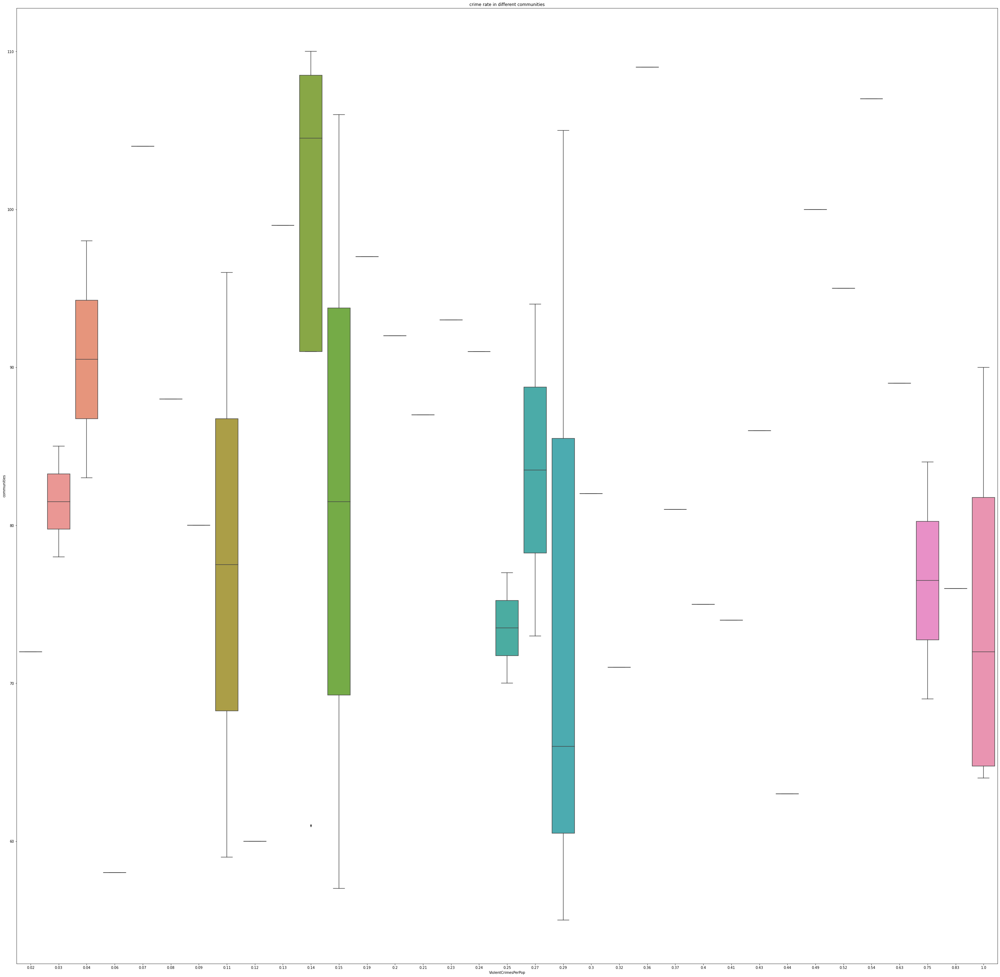

In [ ]:
plt.figure(figsize=(50, 50))
kx = sns.boxplot(x='ViolentCrimesPerPop', y="communityname", data = c)
kx.set(xlabel='ViolentCrimesPerPop', ylabel='communities', title='crime rate in different communities')

In [ ]:
len(text.communityname.unique())

1707

Text(0.5, 1.0, 'Violent Crimes Per population wrt per Capita Income')

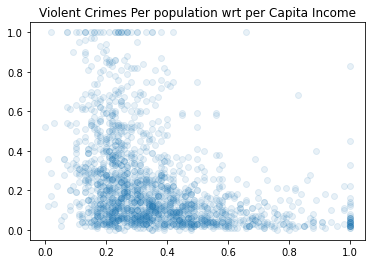

In [ ]:
plt.scatter(text.perCapInc, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt per Capita Income")

Text(0.5, 1.0, 'Violent Crimes Per population wrt percentage of people living in urban areas')

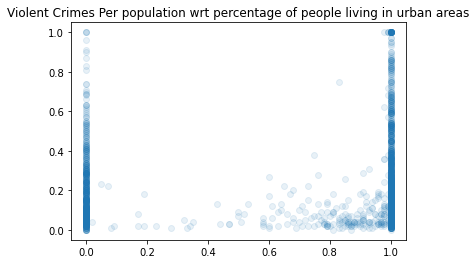

In [ ]:
plt.scatter(text.pctUrban, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt percentage of people living in urban areas")

Text(0.5, 1.0, 'Violent Crimes Per population wrt percentage of population that is 12-21 in age')

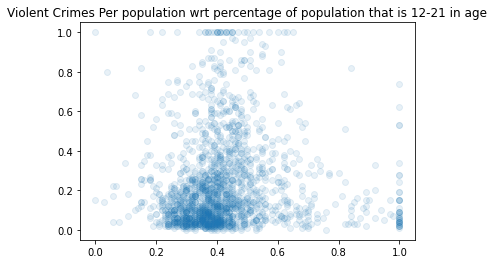

In [ ]:
plt.scatter(text.agePct12t21, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt percentage of population that is 12-21 in age")

Text(0.5, 1.0, 'Violent Crimes Per population wrt percentage of population that is 12-29 in age')

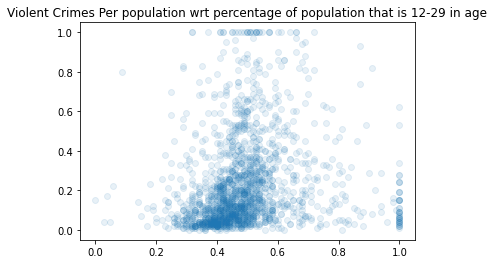

In [ ]:
plt.scatter(text.agePct12t29, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt percentage of population that is 12-29 in age")

Text(0.5, 1.0, 'Violent Crimes Per population wrt percentage of population that is 16-24 in age')

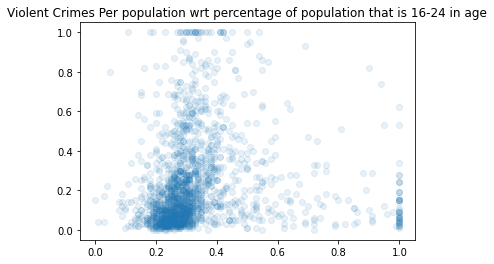

In [ ]:
plt.scatter(text.agePct16t24, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt percentage of population that is 16-24 in age")

Text(0.5, 1.0, 'Violent Crimes Per population wrt percent of people using public transit for commuting')

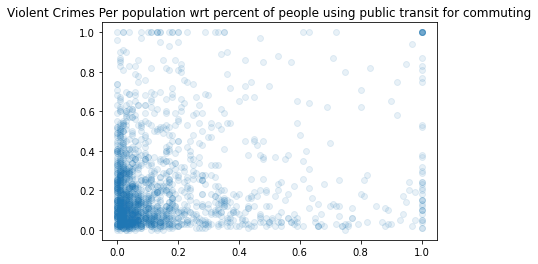

In [ ]:
plt.scatter(text.PctUsePubTrans, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt percent of people using public transit for commuting"
)

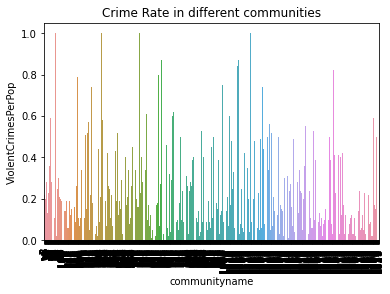

In [ ]:
sns.barplot(x='communityname', y='ViolentCrimesPerPop', data=text)
plt.xticks(None,None,rotation=90)
t=plt.title('Crime Rate in different communities')

In [ ]:
pieLabels = 'True', 'False'
boolean_value = [x[0],x[1]]
figureObject, axesObject = plt.subplots()
# Draw the pie chart
axesObject.pie(boolean_value,labels=pieLabels,autopct='%1.2f',startangle=90)
# Aspect ratio - equal means pie is a circle
axesObject.axis('equal')
plt.show()

KeyError: ignored

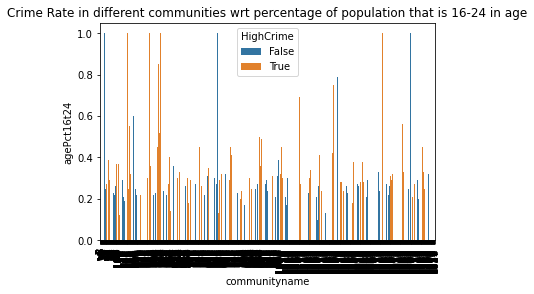

In [ ]:
sns.barplot(x='communityname', y='agePct16t24', hue='HighCrime',data=text)
plt.xticks(None,None,rotation=90)
t=plt.title('Crime Rate in different communities wrt percentage of population that is 16-24 in age')

Text(0.5, 1.0, 'Violent Crimes Per population wrt Race Pct Black')

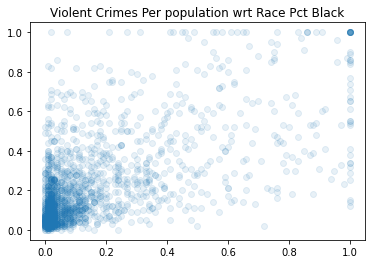

In [ ]:
plt.scatter(text.racepctblack, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt Race Pct Black")

Text(0.5, 1.0, 'Violent Crimes Per population wrt Race Pct White')

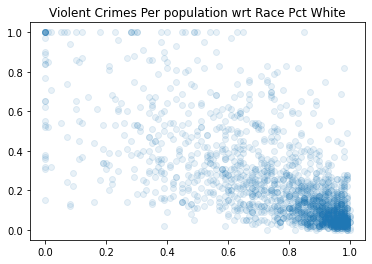

In [ ]:
plt.scatter(text.racePctWhite, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt Race Pct White")

Text(0.5, 1.0, 'Violent Crimes Per population wrt Race Pct Asian')

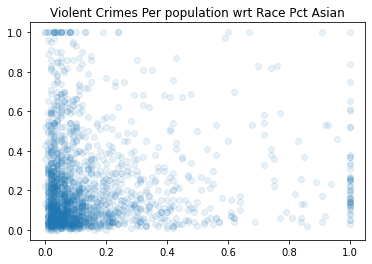

In [ ]:
plt.scatter(text.racePctAsian, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt Race Pct Asian")

Text(0.5, 1.0, 'Violent Crimes Per population wrt Race Pct Hisp')

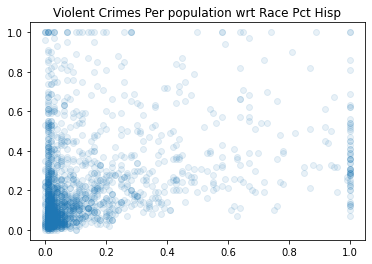

In [ ]:
plt.scatter(text.racePctHisp, text.ViolentCrimesPerPop, alpha=0.1)
plt.title("Violent Crimes Per population wrt Race Pct Hisp")

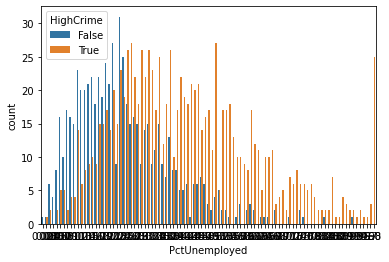

In [ ]:
ax=sns.countplot(x="PctUnemployed" , hue="HighCrime" , data=text)

In [ ]:
ax=sns.countplot(x="PctUnemployed" , hue="HighCrime" , data=text)

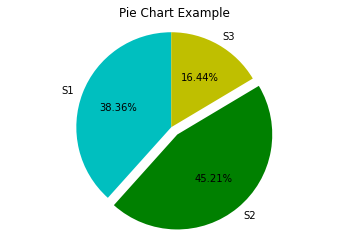

In [ ]:
labels = 'S1', 'S2', 'S3'
sections = [56, 66, 24]
colors = ['c', 'g', 'y']

plt.pie(sections, labels=labels, colors=colors,
        startangle=90,
        explode = (0, 0.1, 0),
        autopct = '%1.2f%%')

plt.axis('equal') # Try commenting this out.
plt.title('Pie Chart Example')
plt.show()